# **Missing Migrants - An Analysis on the Dangers of Seeking Asylum**

Crises across the world have always been the spark of mass migrations of refugees seeking asylum. Although, despite many countries having refugee asylum programs, a widespread reluctance to accept refugees persists. Without a safe home to return to and resistant neighboring counties to refugees, many migrants take their chances in one of two options:

1. Apply through a country's refugee program where acceptance isn't guaranteed (and unlikely in many cases)
2. Or, migrate illegally and risk your safety for the possibility of a new start

According to the [United Nations Refugee Agency](https://www.unrefugees.org/refugee-facts/statistics/) - by the end of 2019, 79.9 million individuals were forcibly displaced worldwide as a result of persecution, conflict, violence or human rights violations. And this trend isn't decreasing (8.7 million increase from the previous year). In fact, new displacement remains very high. One person becomes displaced every 3 seconds – less than the time it takes to read this sentence. That’s 20 people who are newly displaced every minute. In 2019, there were over 30,000 new displacements each day.

## Data Scraping

The challenge with studying refugee migration is that there is often a lack of official data due to the many refugees being forced to seek asylum illegally or outside the mainstream process. Despite this challenge, the Missing Migrant Project was started in 2013 after 368 migrants died in two shipwrecks near the Italian island of Lampedusa in order to track the deaths of migrants, including refugees and asylum-seekers, who have gone missing along mixed migration routes worldwide.

The following CSV dataset was posted as open source data on [Kaggle](https://www.kaggle.com/snocco/missing-migrants-project): 

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import math
import ast

from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

Using the link above we can download the CSV to our local device. Ensuring that the dataset is in the same location as our notebook, we can use pandas to read in our CSV file and print the head of the dataset.

In [2]:
migrantData = pd.read_csv('MissingMigrants-Global-2019-12-31_correct.csv')

print(migrantData.shape)
migrantData.head()

(5987, 20)


,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,52673,Mediterranean,"December 30, 2019",2019,Dec,1.0,NaN,1,11.0,NaN,NaN,NaN,Hypothermia,Unspecififed location off the coast of Algeria,El Watan,"35.568972356329, -1.289773129748",Western Mediterranean,https://bit.ly/2FqQHo4,Uncategorized,1
1,52666,Mediterranean,"December 30, 2019",2019,Dec,1.0,NaN,1,NaN,NaN,1.0,NaN,Presumed drowning,"Recoverd on Calamorcarro Beach, Ceuta",El Foro de Ceuta,"35.912383552874, -5.357673338898",Western Mediterranean,https://bit.ly/39yKRyF,Uncategorized,1
2,52663,East Asia,"December 27, 2019",2019,Dec,5.0,NaN,5,NaN,NaN,3.0,NaN,Unknown,"Bodies found on boat near Sado Island, Niigata...","Japan Times, Kyodo News, AFP","38.154018233313, 138.086032653130",NaN,"http://bit.ly/2sCnBz1, http://bit.ly/2sEra83, ...",Eastern Asia,3
3,52662,Middle East,"December 26, 2019",2019,Dec,7.0,NaN,7,64.0,NaN,NaN,NaN,Drowning,"Van lake near Adilcevaz, Bitlis, Turkey","EFE, BBC, ARYnews","38.777228612085, 42.739257582031",NaN,"http://bit.ly/2ZG2Y19, http://bit.ly/2MLamDf, ...",Western Asia,3
4,52661,Middle East,"December 24, 2019",2019,Dec,12.0,NaN,12,NaN,NaN,NaN,NaN,Air strike,"Al-Raqw market in Saada, Yemen","UN Humanitarian Coordinator in Yemen, Qatar Tr...","17.245364805636, 43.239093360326",NaN,"http://bit.ly/2FjolvD, http://bit.ly/2sD42GR, ...",Western Asia,4


Now that we have our dataset imported into our notebook, let's take a look at what this dataset contains. We see that the dataset has just under 6000 observations and 20 variables. Some key variables that stand out are where the incident occurred, the date, the number of individuals missing or dead, and causes of death.

Make note of the large amount of NaN values in our dataset. As we discussed earlier, due to the nature of refugee migrations, it is often difficult to find consistent datasets without missing information. Without a standardized method of tracking refugee migration, there is often gaps in data. This will pose a challenge in our analysis if left undealt with. We will address these gaps in data in the next phase - Data Processing.

The second dataset we will consider in this analysis is the frequency of approved/rejected asylum cases in regions of interest over time. The United Nations High Comissioner for Refugees covers the movement of asylum seekers and records these statistics. Download this dataset from [Kaggle](https://www.kaggle.com/unitednations/refugee-data?select=asylum_seekers.csv) to the root directory of this project. 

Let's now import our migrant cases dataset so we can take a look at what information it captures:

In [4]:
cases = pd.read_csv('asylum_seekers.csv',low_memory=False)
cases = cases[cases['Applied during year'].notna()]

cases.head()

,Year,Country / territory of asylum/residence,Origin,RSD procedure type / level,Tota pending start-year,of which UNHCR-assisted(start-year),Applied during year,decisions_recognized,decisions_other,Rejected,Otherwise closed,Total decisions,Total pending end-year,of which UNHCR-assisted(end-year)
0,2000,Zimbabwe,Afghanistan,G / FI,0.0,0.0,5.0,5.0,0.0,0.0,0.0,5.0,0.0,0.0
1,2000,South Africa,Afghanistan,G / FI,8.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,8.0,0.0
2,2000,Uzbekistan,Afghanistan,U / FI,265.0,265.0,2156.0,747.0,0.0,112.0,327.0,1186.0,1235.0,1235.0
3,2000,United States of America,Afghanistan,G / EO,196.0,0.0,225.0,151.0,0.0,31.0,68.0,250.0,171.0,0.0
4,2000,United States of America,Afghanistan,G / IN,193.0,0.0,218.0,182.0,0.0,51.0,40.0,273.0,150.0,0.0


In [5]:
monthlyCases = pd.read_csv('asylum_seekers_monthly.csv', low_memory=False)
monthlyCases = monthlyCases[monthlyCases['Value'].notna()]

months = monthlyCases['Month'][0:12]

monthlyCases.head()

,Country / territory of asylum/residence,Origin,Year,Month,Value
0,Australia,Afghanistan,1999,January,8.0
1,Australia,Afghanistan,1999,February,10.0
2,Australia,Afghanistan,1999,March,25.0
3,Australia,Afghanistan,1999,April,25.0
4,Australia,Afghanistan,1999,May,7.0


# Data Processing

Let's first begin by understanding what is in our migrant deaths dataset. This will dictate how we can use this information hypothesize relationships between our data, where we need to fill in gaps, and classify what information is important and what is not needed. 

First we are going to take a look at which regions contain more incidents:

In [6]:
regFreq = migrantData['Region of Incident'].value_counts().to_dict()

print('{:<40} {:<15} \n'.format('Region', 'Frequency of Incidents'))
for name, freq in regFreq.items():
    print('{:<40} {:<15}'.format(name, freq))

Region                                   Frequency of Incidents 

US-Mexico Border                         1612           
North Africa                             1262           
Mediterranean                            1085           
Sub-Saharan Africa                       510            
Central America                          364            
Europe                                   301            
Horn of Africa                           238            
South Asia                               183            
Middle East                              182            
Southeast Asia                           137            
Caribbean                                68             
South America                            36             
East Asia                                6              
North America                            2              
Central Asia                             1              


From first glance we see that the majority of migration incidents occur at the US-Mexico border, North Africa, and the Mediterranean. Although, this comparison may be misleading when analyzing the actual risk involved with migrating. Let's ask ourselves a few questions: 

1. How can we best quantify the risk involved in migrating (death count, number of individuals missing, ratio of deaths to survivors, etc.)
2. What causes certain migrations to be more dangerous than others in terms of number of lives lost or missing?
3. What international factors effect the risk involved in refugee migrations?

It may not be enough to quantify the risk involved in migrating by simply the number of cases per region. Let's take an alternate view of our dataset by visualizing a comparison between region and the number of deaths per case:

In [7]:
map_osm = folium.Map(location=[0, 0], zoom_start=2, min_zoom=2, max_zoom=8)

migrantVisData = migrantData[migrantData['Location Coordinates'].notna()]

holder = []
for num in migrantVisData['Location Coordinates']:
    holder.append(ast.literal_eval(num))

migrantVisData['latLong'] = holder

for index, row in migrantVisData.iterrows():
    # Add circles for each neighborhood corresponding to arrest no.
    deathCount = row['Number Dead']
    if math.isnan(deathCount): deathCount = 1  
    if deathCount > 500: deathCount = 300
            
    folium.CircleMarker(
        location=row['latLong'],
        radius=deathCount/4,
        popup=row[['Reported Date', 'Number Dead', 'Cause of Death', 'Location Coordinates']],
        color='#3186cc',
        fill=True,
        fill_color='#3186cc'
    ).add_to(map_osm)

map_osm

C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


Let's take a look at the information displayed in the map above. Zooming into the cluster in North Africa, we see a large number of incidents occuring above Libya's border during the years from 2014-2016. These migration incidents from Northern Africa to Europe through the Mediterranean Sea will be the focus of our study. 

In [8]:
countryToContinent = pd.read_excel('countries.xlsx')
africanCountry = countryToContinent[(countryToContinent['continent'] == 'Africa')]['country']
europeanCountry = countryToContinent[(countryToContinent['continent'] == 'Europe')]['country']

migrantCases = cases[(cases['Year'].between(2014, 2016)) & (cases['Origin'].isin(africanCountry))
                  & (cases['Country / territory of asylum/residence'].isin(europeanCountry))]

migrantMonthlyCases = monthlyCases[(monthlyCases['Year'].between(2014, 2016)) & 
                                   (monthlyCases['Origin'].isin(africanCountry)) & 
                                   (monthlyCases['Country / territory of asylum/residence'].isin(europeanCountry))]


incidents = migrantData[(migrantData['Reported Year'].between(2014, 2016)) & 
                        ((migrantData['Region of Incident'] == 'Mediterranean') |
                        (migrantData['Region of Incident'] == 'North Africa'))]
incidents['Reported Date'] = incidents[incidents['Reported Date'].notna()]


display(migrantCases.head())
display(migrantMonthlyCases.head())
display(incidents.head())

C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


,Year,Country / territory of asylum/residence,Origin,RSD procedure type / level,Tota pending start-year,of which UNHCR-assisted(start-year),Applied during year,decisions_recognized,decisions_other,Rejected,Otherwise closed,Total decisions,Total pending end-year,of which UNHCR-assisted(end-year)
98284,2014,Austria,Angola,G / FA,0.0,0.0,7.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0
98286,2014,Belgium,Angola,G / FI,102.0,0.0,88.0,10.0,0.0,159.0,40.0,209.0,13.0,0.0
98287,2014,Belgium,Angola,G / JR,26.0,0.0,112.0,0.0,0.0,95.0,5.0,100.0,31.0,0.0
98288,2014,Belgium,Angola,G / RA,0.0,0.0,24.0,0.0,0.0,0.0,25.0,25.0,0.0,0.0
98293,2014,Switzerland,Angola,G / AR,2.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2.0,0.0


,Country / territory of asylum/residence,Origin,Year,Month,Value
266616,Albania,Congo,2014,December,1.0
266618,Albania,Eritrea,2014,May,5.0
266619,Albania,Eritrea,2014,June,4.0
266620,Albania,Eritrea,2014,July,7.0
266621,Albania,Eritrea,2014,August,3.0


,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
3660,43026,Mediterranean,43026,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Drowning,"Bodies recovered near Zarzia or Ben Gardane, T...",IOM Tunisia,"33.206798600000, 11.220954700000",Central Mediterranean,NaN,Uncategorized,4
3662,43655,North Africa,43655,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Sickness and lack of access to medicines,"Bani Walid, Libya",Mixed Migration Monitoring Mechanism Initiativ...,"31.760201600000, 13.977697100000",NaN,NaN,Northern Africa,2
3663,44538,North Africa,44538,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Shot,"Tripoli, Libya",MHub,"32.887209400000, 13.191338300000",NaN,NaN,Northern Africa,2
3664,44540,North Africa,44540,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Vehicle Accident,"Unspecified location, Libya",MHub,"27.549510052990, 13.317198187500",NaN,NaN,Northern Africa,2
3665,44542,North Africa,44542,2016,Dec,1.0,NaN,1,NaN,NaN,NaN,NaN,Dehydration,"Sahara Desert, between Agadez, Niger and Tripo...",MHub,"22.734385541312, 12.939331408172",NaN,NaN,Northern Africa,2


C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


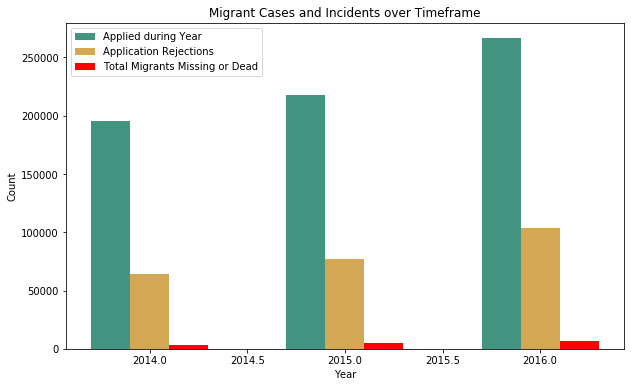

In [13]:
migrantCases['Applied during year'] = migrantCases['Applied during year'].apply(pd.to_numeric)

asylumApps = migrantCases.groupby(['Year'])['Applied during year'].sum().reset_index()
asylumRejections = migrantCases.groupby(['Year'])['Rejected'].sum().reset_index()
migrantIncidents = incidents.groupby(['Reported Year'])['Total Dead and Missing'].sum().reset_index()

asylumApps['Application Rejections'] = asylumRejections['Rejected']
asylumApps['Total Missing or Dead'] = migrantIncidents['Total Dead and Missing']

plt.figure(figsize=(10,6))
ax = plt.subplot(111)
ax.bar(asylumApps['Year']-0.2, asylumApps['Applied during year'], width=0.2, color='#439480', align='center')
ax.bar(asylumApps['Year'], asylumApps['Application Rejections'], width=0.2, color='#d4a755', align='center')
ax.bar(asylumApps['Year']+0.2, asylumApps['Total Missing or Dead'], width=0.2, color='r', align='center')

plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Migrant Cases and Incidents over Timeframe')
ax.legend(['Applied during Year', 'Application Rejections', 'Total Migrants Missing or Dead'])
plt.show()

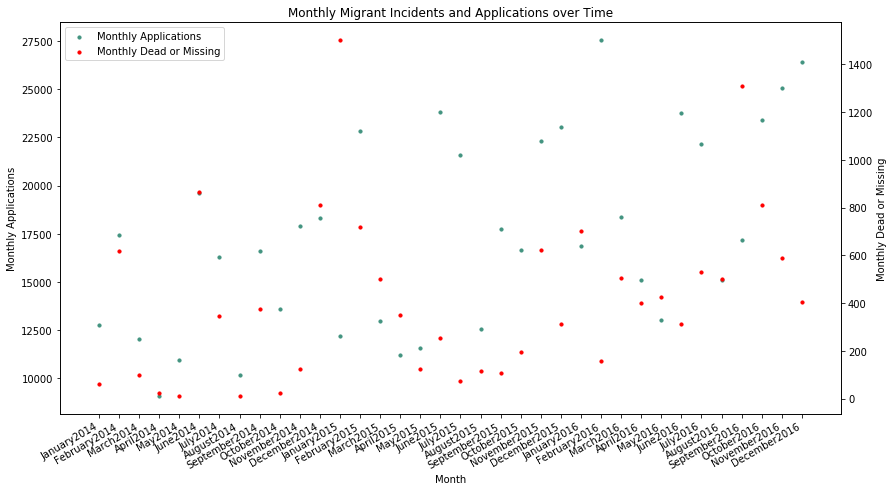

In [28]:
incidentMonths = incidents.groupby(['Reported Year','Reported Month']).agg({'Total Dead and Missing': 'sum'})
monthlyApps = migrantMonthlyCases.groupby(['Year','Month']).agg({'Value': 'sum'})



monthAndYear = []
for i in range(0,3):
    for month in months:
        if i == 0: monthAndYear.append(month + '2014')
        elif i == 1 < 25: monthAndYear.append(month + '2015')
        else: monthAndYear.append(month + '2016')

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

plt.xticks(rotation=90)

l1 = ax1.scatter(monthAndYear, monthlyApps['Value'], s=10, c='#439480', label='Monthly Applications')
l2 = ax2.scatter(monthAndYear, incidentMonths['Total Dead and Missing'], s=10, c='r', label='Monthly Dead or Missing')

fig.set_figheight(8)
fig.set_figwidth(14)

ax1.set_xlabel('Month')
ax1.set_ylabel('Monthly Applications')
ax2.set_ylabel('Monthly Dead or Missing')
plt.title('Monthly Migrant Incidents and Applications over Time')
fig.autofmt_xdate()
plt.legend([l1,l2], ['Monthly Applications', 'Monthly Dead or Missing'], loc='upper left')

plt.show()

Coefficients: 
 [0.04579228]
Mean squared error: 169748.20
Coefficient of determination: -1.01


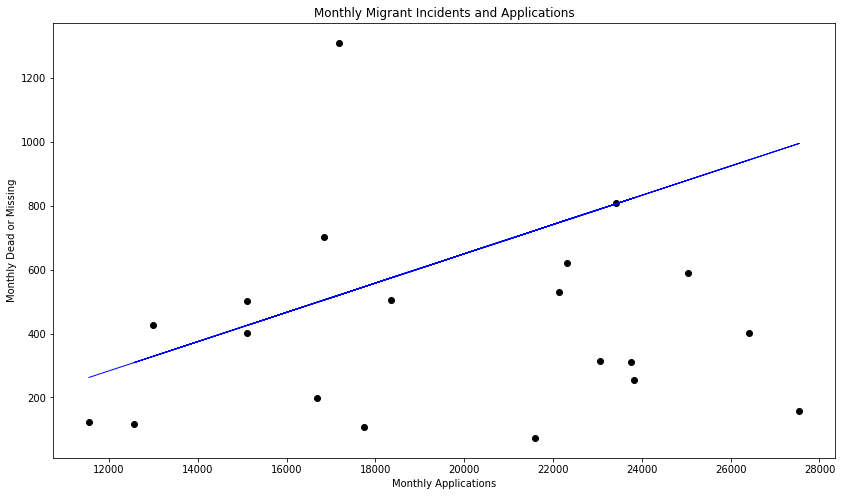

In [68]:
# regData = pd.DataFrame()
# regData['Monthly Apps'] = monthlyApps['Value'].values
# regData['Monthly Incidents'] = incidentMonths['Total Dead and Missing'].values
migrants_X = monthlyApps['Value'].values.reshape(-1, 1)
migrants_y = incidentMonths['Total Dead and Missing'].values

migrants_X_train = migrants_X[:-20]
migrants_X_test = migrants_X[-20:]

migrants_y_train = migrants_y[:-20]
migrants_y_test = migrants_y[-20:]

regr = linear_model.LinearRegression()
regr.fit(migrants_X_train, migrants_y_train)

migrants_y_pred = regr.predict(migrants_X_test)

# The coefficients
print('Coefficients: \n', regr.coef_)
# The mean squared error
print('Mean squared error: %.2f' % mean_squared_error(migrants_y_test, migrants_y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f' % r2_score(migrants_y_test, migrants_y_pred))

# Plot outputs
fig, ax3 = plt.subplots()

ax3.scatter(migrants_X_test, migrants_y_test,  color='black')
ax3.plot(migrants_X_test, migrants_y_pred, color='blue', linewidth=1)

fig.set_figheight(8)
fig.set_figwidth(14)

ax3.set_xlabel('Monthly Applications')
ax3.set_ylabel('Monthly Dead or Missing')
plt.title('Monthly Migrant Incidents and Applications')

plt.show()